# Sepsis Cases Project
This project is a process mining project for the following database:

F. Mannhardt and D. Blinde. “Analyzing the trajectories of patients with sepsis using process mining”. English. In: RADAR+EMISA 2017, Essen, Germany, June 12-13, 2017. CEUR Workshop Proceedings. RADAR + EMISA 2017 ; Conference date: 12- 06-2017 Through 13-06-2017. CEUR-WS.org, 2017, pp. 72–80.

import libraries and defining functions

In [2]:
import pm4py
import pandas as pd
import pm4py
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
from pm4py.algo.analysis.woflan import algorithm as woflan
from IPython.display import display
from pm4py.algo.analysis.woflan import algorithm as woflan
from pm4py.objects.petri_net.utils import reachability_graph
from pm4py.visualization.transition_system import visualizer as ts_visualizer
from pm4py.visualization.petri_net import visualizer as pn_visualizer
from pm4py.algo.decision_mining import algorithm as decision_mining
from pm4py.visualization.petri_net import visualizer
from pm4py.visualization.decisiontree import visualizer as tree_visualizer
from sklearn import tree
import random
import pm4py


c:\Users\Lenovo\anaconda3\envs\dm\lib\site-packages\pm4py\visualization\decisiontree\__init__.py:23: UserWarning: The decisiontree visualizer will be removed in a future release (use Scikit Learn instead).
  warnings.warn("The decisiontree visualizer will be removed in a future release (use Scikit Learn instead).")
c:\Users\Lenovo\anaconda3\envs\dm\lib\site-packages\pm4py\algo\decision_mining\__init__.py:23: UserWarning: The decision_mining package will be removed in a future release.
  warnings.warn("The decision_mining package will be removed in a future release.")


In [4]:
# A function to calculate the Conformance Checking
def aligments(log, net):
    fitness = pm4py.fitness_alignments(log, *net)
    precision = pm4py.precision_alignments(log, *net)
    generalization = generalization_evaluator.apply(log, *net)
    simplicity = simplicity_evaluator.apply(net[0])


    # Create a DataFrame
    df = pd.DataFrame({
        "Metric": ["Fitness", "Precision", "Generalization", "Simplicity"],
        "Value": [fitness["averageFitness"], precision, generalization, simplicity]
    })

    # Print the DataFrame
    print(df)

    # parameters for the soundness check
    woflan_parameters = {
    woflan.Parameters.RETURN_ASAP_WHEN_NOT_SOUND: False,
    woflan.Parameters.PRINT_DIAGNOSTICS: True,
    woflan.Parameters.RETURN_DIAGNOSTICS: False
}


#### Load the CSV and XES files

In [5]:
log = pm4py.read_xes("Sepsis Cases - Event Log.xes", variant="iterparse20")
df = pm4py.convert_to_dataframe(log)
df.to_csv('Sepsis Cases - Event Log.csv')
print(df.columns)
df.head()

c:\Users\Lenovo\anaconda3\envs\dm\lib\site-packages\pm4py\util\dt_parsing\parser.py:77: UserWarning: ISO8601 strings are not fully supported with strpfromiso for Python versions below 3.11
  warnings.warn(


Index(['InfectionSuspected', 'org:group', 'DiagnosticBlood', 'DisfuncOrg',
       'SIRSCritTachypnea', 'Hypotensie', 'SIRSCritHeartRate', 'Infusion',
       'DiagnosticArtAstrup', 'concept:name', 'Age', 'DiagnosticIC',
       'DiagnosticSputum', 'DiagnosticLiquor', 'DiagnosticOther',
       'SIRSCriteria2OrMore', 'DiagnosticXthorax', 'SIRSCritTemperature',
       'time:timestamp', 'DiagnosticUrinaryCulture', 'SIRSCritLeucos',
       'Oligurie', 'DiagnosticLacticAcid', 'lifecycle:transition', 'Diagnose',
       'Hypoxie', 'DiagnosticUrinarySediment', 'DiagnosticECG',
       'case:concept:name', 'Leucocytes', 'CRP', 'LacticAcid'],
      dtype='object')


,InfectionSuspected,org:group,DiagnosticBlood,DisfuncOrg,SIRSCritTachypnea,Hypotensie,SIRSCritHeartRate,Infusion,DiagnosticArtAstrup,concept:name,...,DiagnosticLacticAcid,lifecycle:transition,Diagnose,Hypoxie,DiagnosticUrinarySediment,DiagnosticECG,case:concept:name,Leucocytes,CRP,LacticAcid
0,True,A,True,True,True,True,True,True,True,ER Registration,...,True,complete,A,False,True,True,A,NaN,NaN,NaN
1,NaN,B,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Leucocytes,...,NaN,complete,NaN,NaN,NaN,NaN,A,9.6,NaN,NaN
2,NaN,B,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CRP,...,NaN,complete,NaN,NaN,NaN,NaN,A,NaN,21.0,NaN
3,NaN,B,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LacticAcid,...,NaN,complete,NaN,NaN,NaN,NaN,A,NaN,NaN,2.2
4,NaN,C,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ER Triage,...,NaN,complete,NaN,NaN,NaN,NaN,A,NaN,NaN,NaN


Discovering the number of traces in the log

In [6]:
n_traces = len(log["case:concept:name"].unique())
print(f"number of traces: {n_traces}")

number of traces: 1050


#### Most common process variants

In [7]:
variants = pm4py.get_variants(log)
common_variants = pd.DataFrame(variants.items(), columns=["variant", "count"]).sort_values("count", ascending=False)
common_variants["percentile"] = common_variants["count"] / common_variants["count"].sum() * 100
pd.set_option("display.max_colwidth", None)
common_variants.head(10)[["variant", "count", "percentile"]]

,variant,count,percentile
21,"(ER Registration, ER Triage, ER Sepsis Triage)",35,3.333333
24,"(ER Registration, ER Triage, ER Sepsis Triage, Leucocytes, CRP)",24,2.285714
95,"(ER Registration, ER Triage, ER Sepsis Triage, CRP, Leucocytes)",22,2.095238
3,"(ER Registration, ER Triage, ER Sepsis Triage, CRP, LacticAcid, Leucocytes, IV Liquid, IV Antibiotics)",13,1.238095
36,"(ER Registration, ER Triage, ER Sepsis Triage, Leucocytes, CRP, LacticAcid)",11,1.047619
139,"(ER Registration, ER Triage, ER Sepsis Triage, Leucocytes, CRP, LacticAcid, IV Liquid, IV Antibiotics)",9,0.857143
1,"(ER Registration, ER Triage, ER Sepsis Triage, Leucocytes, LacticAcid, CRP, IV Liquid, IV Antibiotics)",7,0.666667
158,"(ER Registration, ER Triage, ER Sepsis Triage, Leucocytes, CRP, Admission NC, Release A)",5,0.476190
232,"(ER Registration, ER Triage, ER Sepsis Triage, LacticAcid, Leucocytes, CRP, IV Liquid, IV Antibiotics)",5,0.476190
83,"(ER Registration, ER Triage, ER Sepsis Triage, CRP, Leucocytes, LacticAcid, IV Liquid, IV Antibiotics)",5,0.476190


## Filtering the log
we filtered according to vaild start activities and end activities

In [8]:
start_activities = pm4py.stats.get_start_activities(log)
end_activities = pm4py.stats.get_end_activities(log)
print("Start activities:")
display(start_activities)
print("End activities:")
display(end_activities)

Start activities:


{'ER Registration': 995,
 'IV Liquid': 14,
 'ER Triage': 6,
 'CRP': 10,
 'ER Sepsis Triage': 7,
 'Leucocytes': 18}

End activities:


{'Release A': 393,
 'Return ER': 291,
 'IV Antibiotics': 87,
 'Release B': 55,
 'ER Sepsis Triage': 49,
 'Leucocytes': 44,
 'IV Liquid': 12,
 'Release C': 19,
 'CRP': 41,
 'LacticAcid': 24,
 'Release D': 14,
 'Admission NC': 14,
 'Release E': 5,
 'ER Triage': 2}

In [9]:
initial_log_len = len(log)

valid_star_activity = {"ER Registration"}
valid_end_activities = {"Release A", "Release B", "Release C", "Release D", "Release E", "Return ER"}

filtered_log = pm4py.filter_start_activities(log, valid_star_activity)
filtered_log = pm4py.filter_end_activities(filtered_log, valid_end_activities)

print("Filtered log length:", len(filtered_log))
print((initial_log_len - len(filtered_log))/initial_log_len)
n_traces = len(filtered_log["case:concept:name"].unique())
print(f"Remaining traces: {n_traces}")

Filtered log length: 12436
0.18259497830945182
Remaining traces: 734


In [10]:
start_activities = pm4py.stats.get_start_activities(filtered_log)
end_activities = pm4py.stats.get_end_activities(filtered_log)
print("Start activities:")
display(start_activities)
print("End activities:")
display(end_activities)

Start activities:


{'ER Registration': 734}

End activities:


{'Release A': 376,
 'Return ER': 275,
 'Release B': 49,
 'Release C': 16,
 'Release D': 13,
 'Release E': 5}

#### Most common process variants in the filtered log

In [11]:
variants = pm4py.get_variants(filtered_log)
common_variants = pd.DataFrame(variants.items(), columns=["variant", "count"]).sort_values("count", ascending=False)
common_variants["percentile"] = common_variants["count"] / common_variants["count"].sum() * 100
pd.set_option("display.max_colwidth", None)
common_variants.head(10)[["variant", "count", "percentile"]]


,variant,count,percentile
122,"(ER Registration, ER Triage, ER Sepsis Triage, Leucocytes, CRP, Admission NC, Release A)",5,0.681199
183,"(ER Registration, ER Triage, ER Sepsis Triage, LacticAcid, Leucocytes, CRP, IV Liquid, IV Antibiotics, Admission NC, Release A)",4,0.544959
48,"(ER Registration, ER Triage, ER Sepsis Triage, CRP, Leucocytes, Admission NC, Release A)",4,0.544959
213,"(ER Registration, ER Triage, ER Sepsis Triage, Leucocytes, LacticAcid, CRP, IV Liquid, IV Antibiotics, Admission NC, CRP, Leucocytes, Release A)",4,0.544959
269,"(ER Registration, ER Triage, ER Sepsis Triage, Leucocytes, CRP, LacticAcid, IV Liquid, IV Antibiotics, Admission NC, Leucocytes, CRP, Release A)",4,0.544959
34,"(ER Registration, ER Triage, ER Sepsis Triage, IV Liquid, Leucocytes, CRP, LacticAcid, IV Antibiotics, Admission NC, Leucocytes, CRP, Release A, Return ER)",3,0.408719
121,"(ER Registration, ER Triage, ER Sepsis Triage, Leucocytes, CRP, LacticAcid, IV Liquid, IV Antibiotics, Admission NC, CRP, Release A, Return ER)",3,0.408719
596,"(ER Registration, ER Triage, ER Sepsis Triage, IV Liquid, IV Antibiotics, Leucocytes, LacticAcid, CRP, Admission NC, Leucocytes, CRP, Release A, Return ER)",3,0.408719
126,"(ER Registration, ER Triage, ER Sepsis Triage, CRP, LacticAcid, Leucocytes, IV Liquid, IV Antibiotics, Admission NC, Release A)",3,0.408719
342,"(ER Registration, ER Triage, ER Sepsis Triage, LacticAcid, Leucocytes, CRP, IV Liquid, IV Antibiotics, Admission NC, Leucocytes, CRP, CRP, Leucocytes, Release A)",2,0.272480


## Process Discovery and Conformance Checking

#### Inductive algorithm discovery on the entire log
we started with applying the inductive algorithm on the entire filtered log in order to get a general picture of the processes. This is one of the base models from which we will progress to the final model.

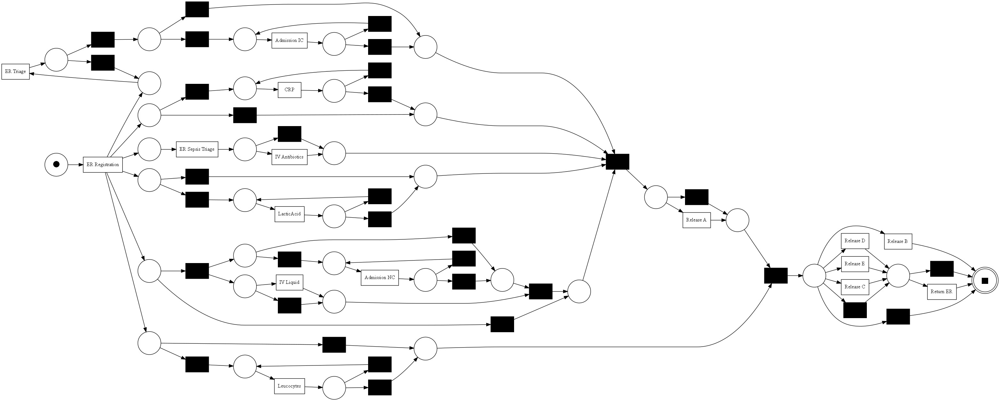

In [324]:
pn1, im, fm = pm4py.discover_petri_net_inductive(filtered_log)
pm4py.view_petri_net(pn1, im, fm)


#### Alpha algorithm discovery on the entire log
Here too, the discovery made is part of the discovery of the basic model from which we will progress to the discovery of the final model, because as we learned these algorithms do not necessarily produce models that are sound. Here we have already started to discover a model each time from a certain amount of traces from the log and not from the entire log. We chose each time a certain group of n most common traces and from that we discovered the model.


Alpha Petri Net for 1 most common variants


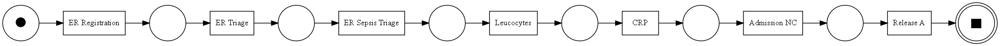

Alpha Petri Net for 2 most common variants


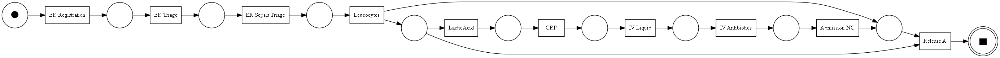

Alpha Petri Net for 3 most common variants


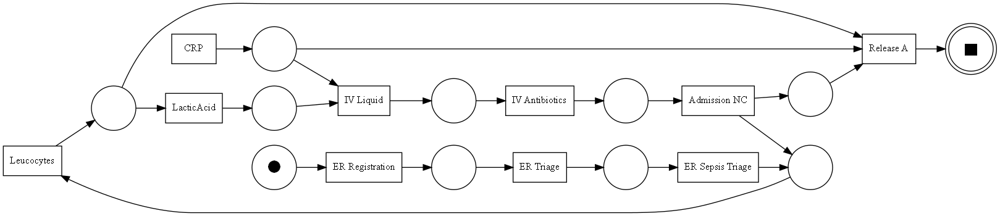

Alpha Petri Net for 4 most common variants


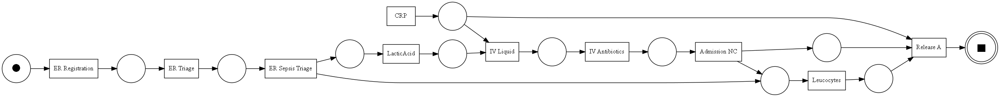

Alpha Petri Net for 5 most common variants


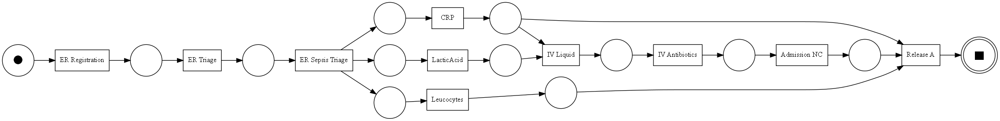

Alpha Petri Net for 10 most common variants


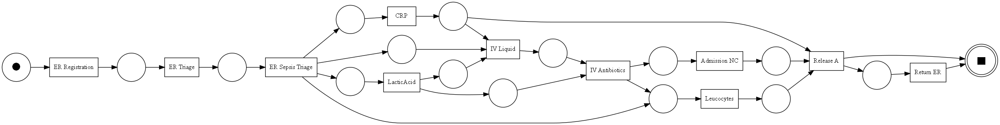

Alpha Petri Net for 20 most common variants


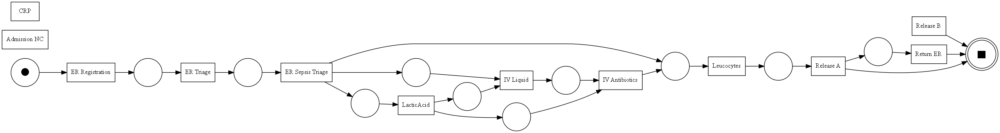

Alpha Petri Net for 25 most common variants


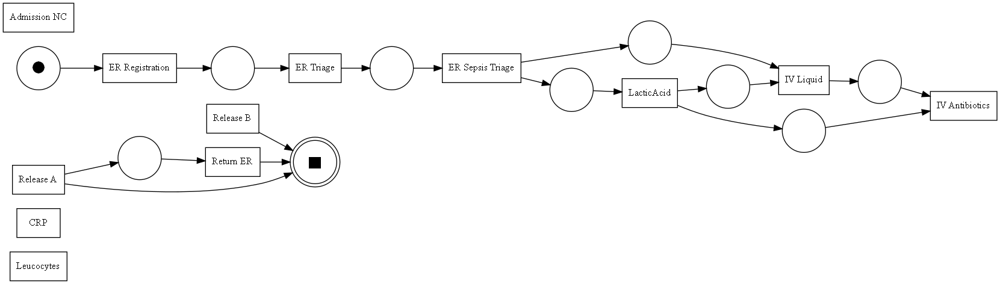

Alpha Petri Net for 30 most common variants


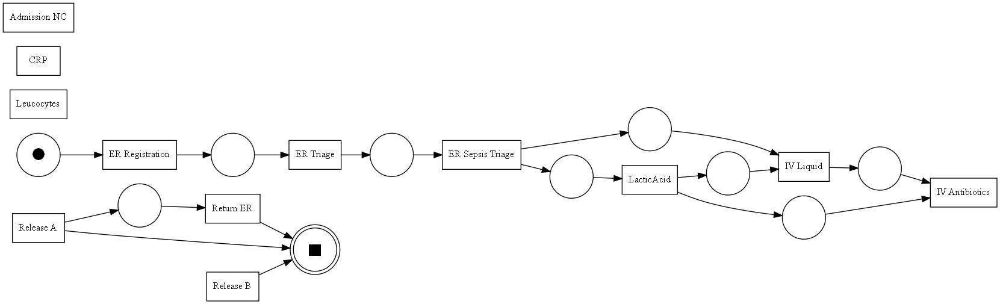

Alpha Petri Net for 35 most common variants


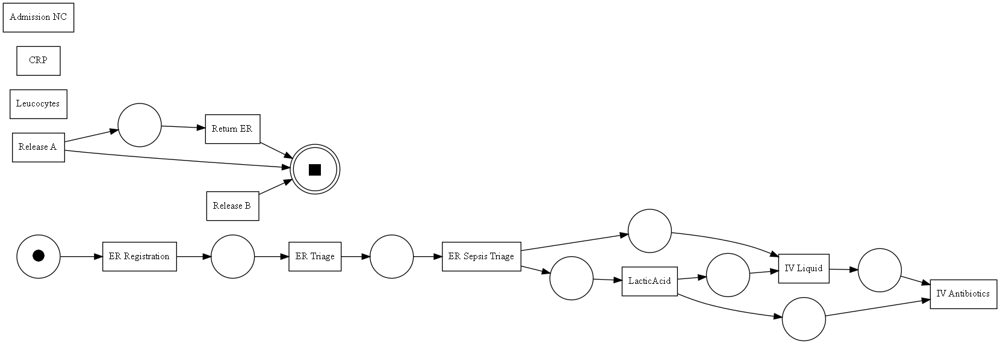

Alpha Petri Net for 685 most common variants


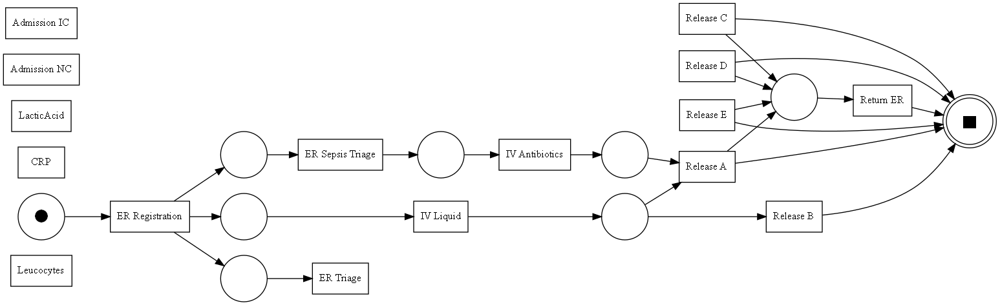

In [325]:
values_of_i = [1, 2, 3, 4, 5, 10, 20, 25,30, 35, len(common_variants)]

for i in values_of_i:
    # Filter the log for the first i variants
    current_log = pm4py.filter_variants_top_k(filtered_log, i)
    current_log_copy = current_log.copy()
        
    # Discover a Petri net for the most common variant
    pn_cur_alpha, im_cur_alpha, fm_cur_alpha = pm4py.discover_petri_net_alpha(current_log_copy)
    net_alpha = pm4py.discover_petri_net_alpha(current_log_copy)
    print(f"Alpha Petri Net for {i} most common variants")
    pm4py.view_petri_net(pn_cur_alpha, im_cur_alpha, fm_cur_alpha)


## Inductive algorithm and Heuristics algorithm discovery on a variable number random traces

### buliding the model with random number of traces

Here we applied the inductive algorithm and the heuristics algorithm (wherever we got a sound model), which according to the lectures is the best algorithm for finding a model. Here, too, we chose each time a certain random number of traces from which we discovered the model.


*******************************************************************************************************
Now selecting 1 random traces
*******************************************************************************************************
Number of traces in random_log: 1
Number of traces in remaining_log: 733
Total number of traces (random + remaining): 734
train-test ratio: train: 0.14% , test: 99.86%
*******************************************************************************************************
Inductive Petri Net for 1 random traces
*******************************************************************************************************


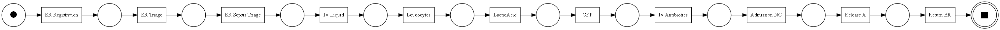

*******************************************************************************************************
conformance checking for the inductive algorithm for 1 random traces
*******************************************************************************************************














































































aligning log, completed variants :: 100%|██████████| 684/684 [00:09<00:00, 74.12it/s]
computing precision with alignments, completed variants ::   1%|▏         | 64/5115 [2:30:17<197:41:18, 140.90s/it]
computing precision with alignments, completed variants :: 100%|██████████| 5114/5114 [00:13<00:00, 386.43it/s]
replaying log with TBR, completed traces :: 100%|██████████| 684/684 [00:00<00:00, 843.94it/s]
c:\Users\Lenovo\anaconda3\envs\dm\lib\site-packages\pm4py\algo\discovery\dfg\adapters\pandas\df_statistics.py:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[start_timestamp_key] = df[timestamp_key]


           Metric     Value
0         Fitness  0.615434
1       Precision  0.999522
2  Generalization  0.964644
3      Simplicity  1.000000
*******************************************************************************************************
Heuristics Petri Net for 1 random traces
*******************************************************************************************************


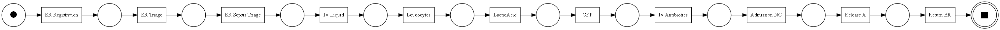

*******************************************************************************************************
conformance checking for the heuristics algorithm for 1 random traces
*******************************************************************************************************
********************************************************************************
Soundeness check: 
********************************************************************************
Input is ok.
Petri Net is a workflow net.
Every place is covered by s-components.
There are no dead tasks.
All tasks are live.
Is sound: True


aligning log, completed variants :: 100%|██████████| 684/684 [00:06<00:00, 107.95it/s]
computing precision with alignments, completed variants :: 100%|██████████| 5114/5114 [00:13<00:00, 369.77it/s]
replaying log with TBR, completed traces :: 100%|██████████| 684/684 [00:00<00:00, 835.31it/s]


           Metric     Value
0         Fitness  0.615434
1       Precision  0.999522
2  Generalization  0.964644
3      Simplicity  1.000000
*******************************************************************************************************
Now selecting 2 random traces
*******************************************************************************************************
Number of traces in random_log: 2
Number of traces in remaining_log: 732
Total number of traces (random + remaining): 734
train-test ratio: train: 0.27% , test: 99.73%
*******************************************************************************************************
Inductive Petri Net for 2 random traces
*******************************************************************************************************


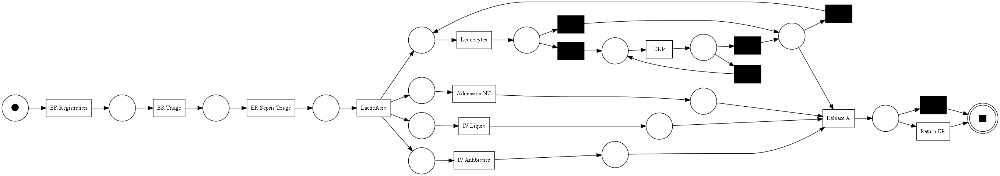

*******************************************************************************************************
conformance checking for the inductive algorithm for 2 random traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 685/685 [00:14<00:00, 47.53it/s]
computing precision with alignments, completed variants :: 100%|██████████| 5115/5115 [00:16<00:00, 313.44it/s]
replaying log with TBR, completed traces :: 100%|██████████| 685/685 [00:01<00:00, 476.63it/s]
c:\Users\Lenovo\anaconda3\envs\dm\lib\site-packages\pm4py\algo\discovery\dfg\adapters\pandas\df_statistics.py:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[start_timestamp_key] = df[timestamp_key]


           Metric    Value
0         Fitness  0.84707
1       Precision  0.92669
2  Generalization  0.96487
3      Simplicity  0.73913
*******************************************************************************************************
Heuristics Petri Net for 2 random traces
*******************************************************************************************************


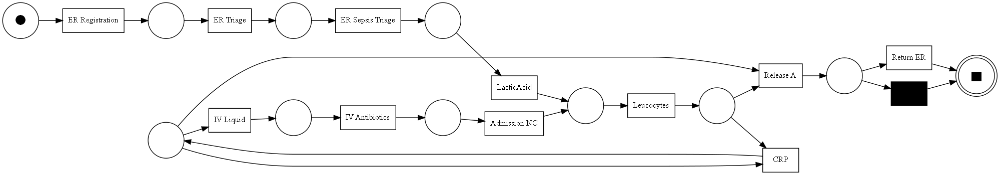

*******************************************************************************************************
conformance checking for the heuristics algorithm for 2 random traces
*******************************************************************************************************
********************************************************************************
Soundeness check: 
********************************************************************************
Input is ok.
Petri Net is a workflow net.
The following places are not covered by an s-component: [intplace_CRP, intplace_Leucocytes, intplace_Release A, pre_Admission NC, pre_ER Sepsis Triage, pre_ER Triage, pre_IV Antibiotics, pre_LacticAcid, pre_Leucocytes, sink0, source0].
Not well-handled pairs are: [(23, 4), (23, 38), (13, 38)].
The following places are uncovered in uniform invariants: [intplace_CRP, intplace_Leucocytes, intplace_Release A, pre_Admission NC, pre_ER Sepsis Triage, pre_ER Triage, pre_IV Antibiotics, pre_LacticAcid,

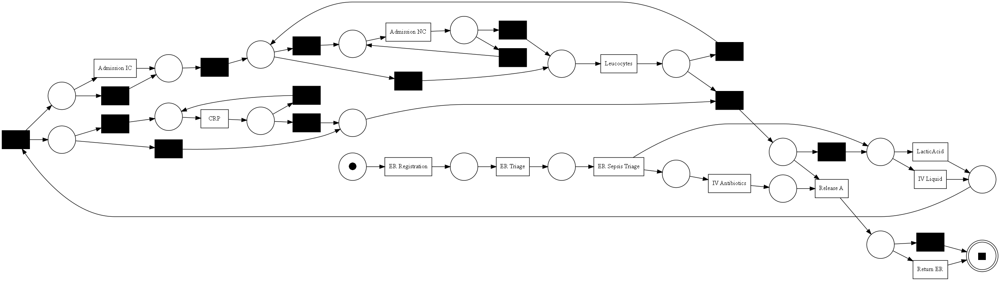

*******************************************************************************************************
conformance checking for the inductive algorithm for 3 random traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 682/682 [01:10<00:00,  9.73it/s]
computing precision with alignments, completed variants :: 100%|██████████| 5102/5102 [00:25<00:00, 202.79it/s]
replaying log with TBR, completed traces :: 100%|██████████| 682/682 [00:02<00:00, 340.98it/s]
c:\Users\Lenovo\anaconda3\envs\dm\lib\site-packages\pm4py\algo\discovery\dfg\adapters\pandas\df_statistics.py:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[start_timestamp_key] = df[timestamp_key]


           Metric     Value
0         Fitness  0.898609
1       Precision  0.743009
2  Generalization  0.962475
3      Simplicity  0.705882
*******************************************************************************************************
Heuristics Petri Net for 3 random traces
*******************************************************************************************************


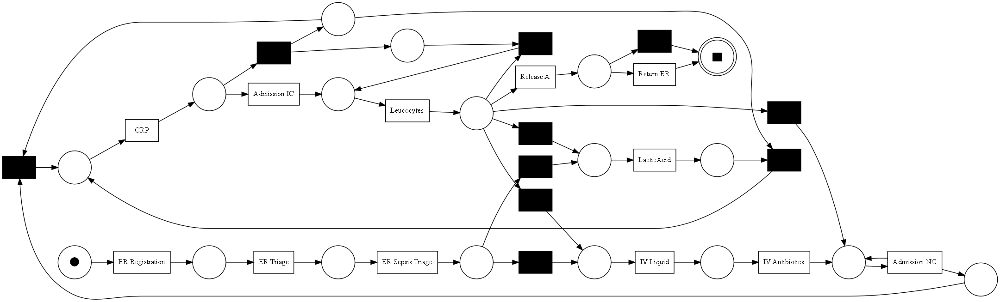

*******************************************************************************************************
conformance checking for the heuristics algorithm for 3 random traces
*******************************************************************************************************
********************************************************************************
Soundeness check: 
********************************************************************************
Input is ok.
Petri Net is a workflow net.
The following places are not covered by an s-component: [intplace_CRP, intplace_ER Sepsis Triage, intplace_Leucocytes, intplace_Release A, pre_Admission NC, pre_CRP, pre_ER Sepsis Triage, pre_ER Triage, pre_IV Antibiotics, pre_IV Liquid, pre_LacticAcid, pre_Leucocytes, sink0, source0, splace_in_CRP_Admission NC_0, splace_in_CRP_CRP_0, splace_in_CRP_LacticAcid_1, splace_in_Leucocytes_CRP_1].
Not well-handled pairs are: [(39, 62), (45, 14), (45, 32), (19, 24), (23, 14), (23, 32), (23, 34), (39, 4

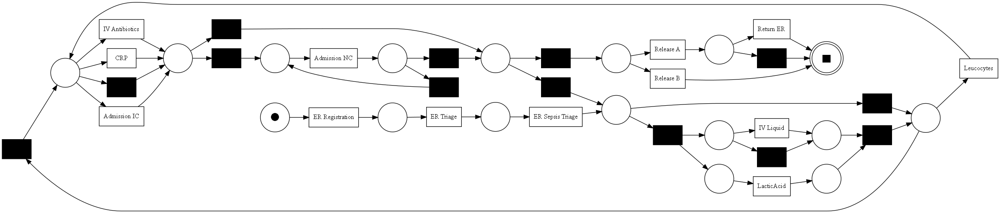

*******************************************************************************************************
conformance checking for the inductive algorithm for 4 random traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 682/682 [00:21<00:00, 31.04it/s]
computing precision with alignments, completed variants :: 100%|██████████| 5101/5101 [00:30<00:00, 167.13it/s]
replaying log with TBR, completed traces :: 100%|██████████| 682/682 [00:01<00:00, 343.35it/s]


           Metric     Value
0         Fitness  0.942116
1       Precision  0.483976
2  Generalization  0.958965
3      Simplicity  0.661538
*******************************************************************************************************
Now selecting 5 random traces
*******************************************************************************************************
Number of traces in random_log: 5
Number of traces in remaining_log: 729
Total number of traces (random + remaining): 734
train-test ratio: train: 0.68% , test: 99.32%
*******************************************************************************************************
Inductive Petri Net for 5 random traces
*******************************************************************************************************


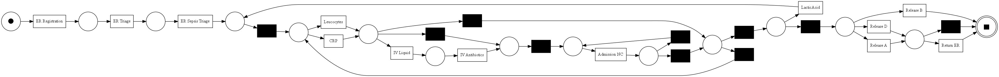

*******************************************************************************************************
conformance checking for the inductive algorithm for 5 random traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 682/682 [00:22<00:00, 30.88it/s]
computing precision with alignments, completed variants :: 100%|██████████| 5091/5091 [00:46<00:00, 110.44it/s]
replaying log with TBR, completed traces :: 100%|██████████| 682/682 [00:03<00:00, 216.00it/s]


           Metric     Value
0         Fitness  0.896939
1       Precision  0.720463
2  Generalization  0.949494
3      Simplicity  0.703704
*******************************************************************************************************
Now selecting 8 random traces
*******************************************************************************************************
Number of traces in random_log: 8
Number of traces in remaining_log: 726
Total number of traces (random + remaining): 734
train-test ratio: train: 1.09% , test: 98.91%
*******************************************************************************************************
Inductive Petri Net for 8 random traces
*******************************************************************************************************


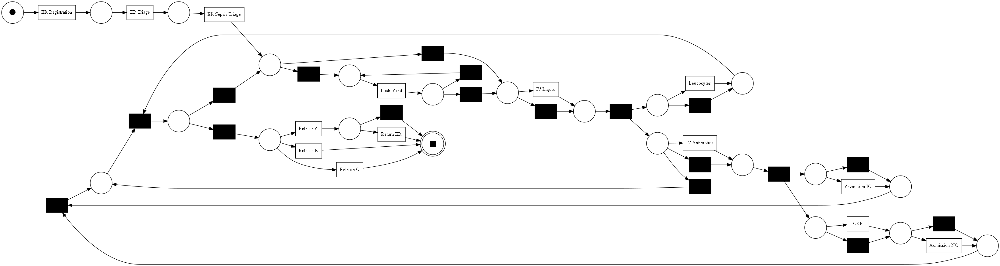

*******************************************************************************************************
conformance checking for the inductive algorithm for 8 random traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 678/678 [00:55<00:00, 12.29it/s]
computing precision with alignments, completed variants :: 100%|██████████| 5066/5066 [02:21<00:00, 35.85it/s] 
replaying log with TBR, completed traces :: 100%|██████████| 678/678 [00:02<00:00, 257.95it/s]


           Metric     Value
0         Fitness  0.973806
1       Precision  0.342597
2  Generalization  0.956014
3      Simplicity  0.658537
*******************************************************************************************************
Now selecting 9 random traces
*******************************************************************************************************
Number of traces in random_log: 9
Number of traces in remaining_log: 725
Total number of traces (random + remaining): 734
train-test ratio: train: 1.23% , test: 98.77%
*******************************************************************************************************
Inductive Petri Net for 9 random traces
*******************************************************************************************************


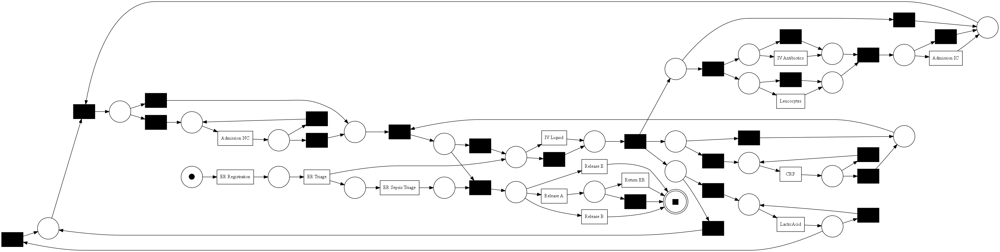

*******************************************************************************************************
conformance checking for the inductive algorithm for 9 random traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 677/677 [01:48<00:00,  6.22it/s]
computing precision with alignments, completed variants :: 100%|██████████| 5079/5079 [12:55<00:00,  6.55it/s]  
replaying log with TBR, completed traces :: 100%|██████████| 677/677 [00:03<00:00, 191.76it/s]


           Metric     Value
0         Fitness  0.987239
1       Precision  0.370310
2  Generalization  0.950632
3      Simplicity  0.653846
*******************************************************************************************************
Now selecting 10 random traces
*******************************************************************************************************
Number of traces in random_log: 10
Number of traces in remaining_log: 724
Total number of traces (random + remaining): 734
train-test ratio: train: 1.36% , test: 98.64%
*******************************************************************************************************
Inductive Petri Net for 10 random traces
*******************************************************************************************************


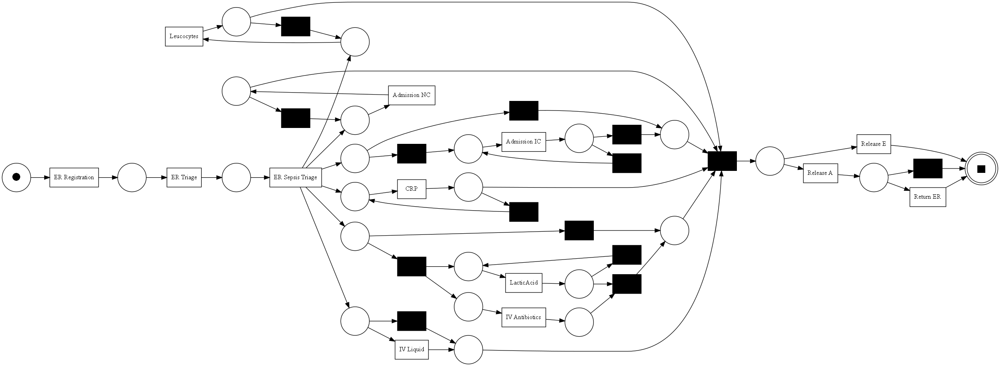

*******************************************************************************************************
conformance checking for the inductive algorithm for 10 random traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 676/676 [00:25<00:00, 26.68it/s]
computing precision with alignments, completed variants :: 100%|██████████| 5038/5038 [09:32<00:00,  8.80it/s]  
replaying log with TBR, completed traces :: 100%|██████████| 676/676 [00:01<00:00, 372.51it/s]


           Metric     Value
0         Fitness  0.962413
1       Precision  0.519143
2  Generalization  0.916886
3      Simplicity  0.629630
*******************************************************************************************************
Now selecting 50 random traces
*******************************************************************************************************
Number of traces in random_log: 50
Number of traces in remaining_log: 684
Total number of traces (random + remaining): 734
train-test ratio: train: 6.81% , test: 93.19%
*******************************************************************************************************
Inductive Petri Net for 50 random traces
*******************************************************************************************************


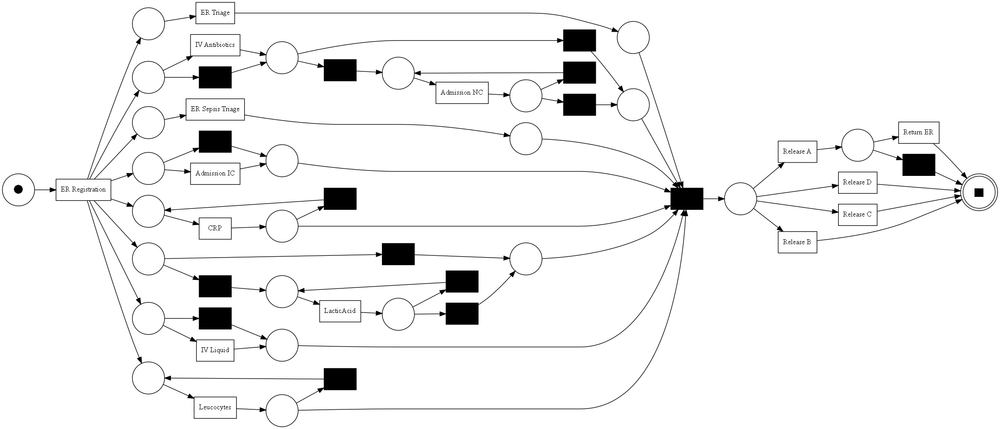

*******************************************************************************************************
conformance checking for the inductive algorithm for 50 random traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 642/642 [00:22<00:00, 28.86it/s]
computing precision with alignments, completed variants :: 100%|██████████| 4865/4865 [10:49<00:00,  7.49it/s]
replaying log with TBR, completed traces :: 100%|██████████| 642/642 [00:01<00:00, 384.16it/s]


           Metric     Value
0         Fitness  0.996497
1       Precision  0.502707
2  Generalization  0.928343
3      Simplicity  0.591398
*******************************************************************************************************
Now selecting 100 random traces
*******************************************************************************************************
Number of traces in random_log: 100
Number of traces in remaining_log: 634
Total number of traces (random + remaining): 734
train-test ratio: train: 13.62% , test: 86.38%
*******************************************************************************************************
Inductive Petri Net for 100 random traces
*******************************************************************************************************


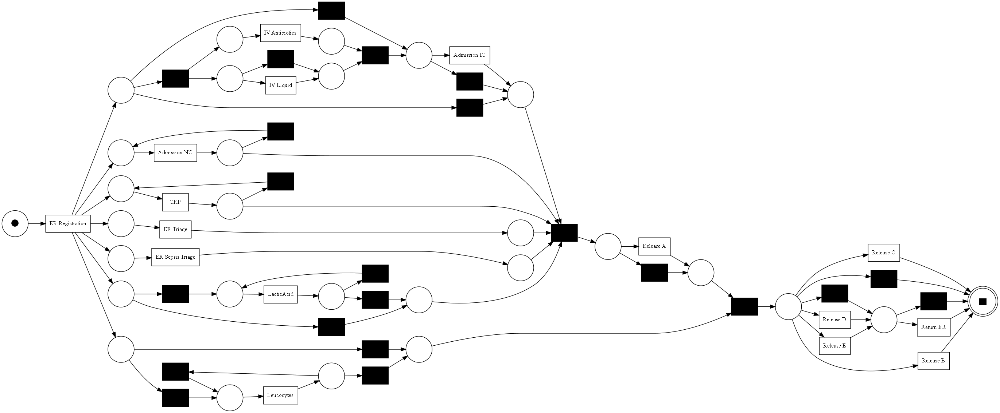

*******************************************************************************************************
conformance checking for the inductive algorithm for 100 random traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 598/598 [00:25<00:00, 23.31it/s]
computing precision with alignments, completed variants :: 100%|██████████| 4623/4623 [08:21<00:00,  9.23it/s]
replaying log with TBR, completed traces :: 100%|██████████| 598/598 [00:01<00:00, 344.17it/s]


           Metric     Value
0         Fitness  0.997981
1       Precision  0.489577
2  Generalization  0.894473
3      Simplicity  0.592920
*******************************************************************************************************
Now selecting 150 random traces
*******************************************************************************************************
Number of traces in random_log: 150
Number of traces in remaining_log: 584
Total number of traces (random + remaining): 734
train-test ratio: train: 20.44% , test: 79.56%
*******************************************************************************************************
Inductive Petri Net for 150 random traces
*******************************************************************************************************


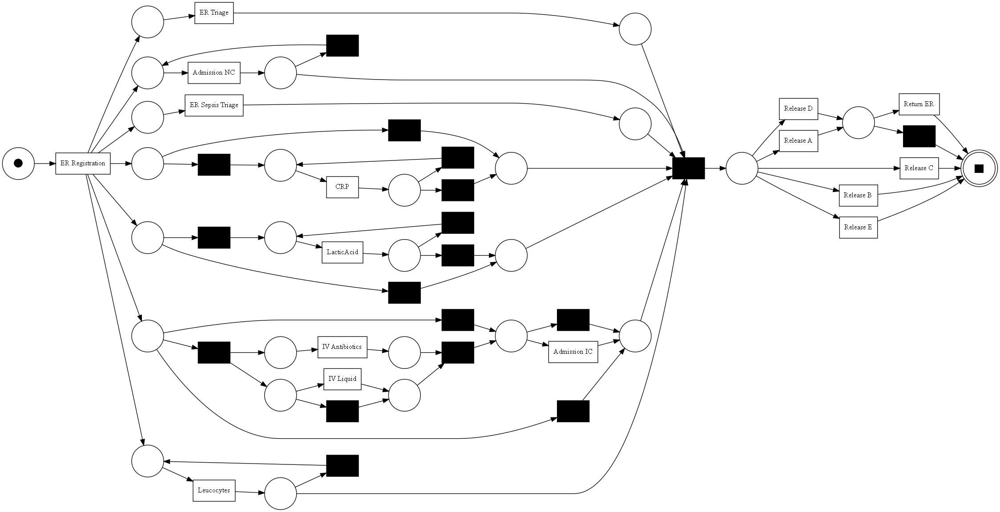

*******************************************************************************************************
conformance checking for the inductive algorithm for 150 random traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 553/553 [00:21<00:00, 25.45it/s]
computing precision with alignments, completed variants :: 100%|██████████| 4425/4425 [07:52<00:00,  9.37it/s]
replaying log with TBR, completed traces :: 100%|██████████| 553/553 [00:01<00:00, 363.75it/s]


           Metric     Value
0         Fitness  0.998271
1       Precision  0.457234
2  Generalization  0.897544
3      Simplicity  0.592233
*******************************************************************************************************
Now selecting 250 random traces
*******************************************************************************************************
Number of traces in random_log: 250
Number of traces in remaining_log: 484
Total number of traces (random + remaining): 734
train-test ratio: train: 34.06% , test: 65.94%
*******************************************************************************************************
Inductive Petri Net for 250 random traces
*******************************************************************************************************


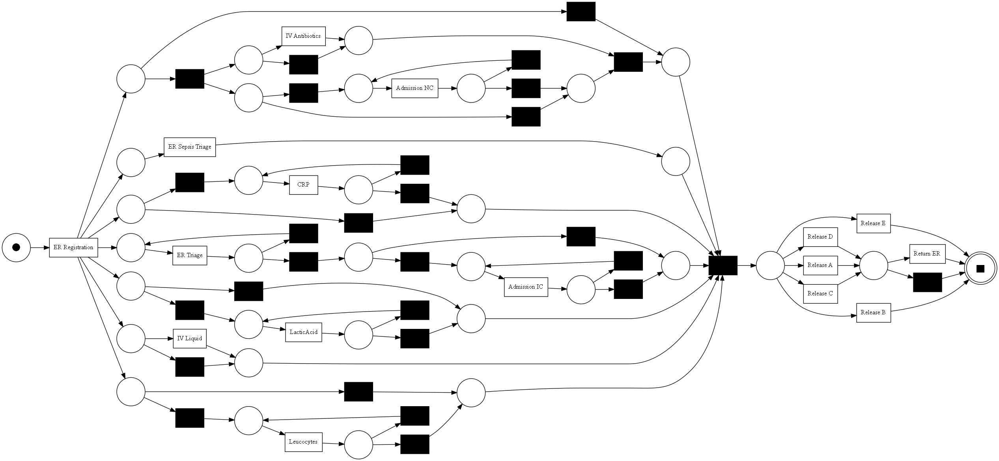

*******************************************************************************************************
conformance checking for the inductive algorithm for 250 random traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 460/460 [07:27<00:00,  1.03it/s]
computing precision with alignments, completed variants :: 100%|██████████| 3562/3562 [2:30:06<00:00,  2.53s/it]  
replaying log with TBR, completed traces :: 100%|██████████| 460/460 [00:01<00:00, 342.88it/s]


           Metric     Value
0         Fitness  0.999880
1       Precision  0.311481
2  Generalization  0.819235
3      Simplicity  0.612403
*******************************************************************************************************
Now selecting 300 random traces
*******************************************************************************************************
Number of traces in random_log: 300
Number of traces in remaining_log: 434
Total number of traces (random + remaining): 734
train-test ratio: train: 40.87% , test: 59.13%
*******************************************************************************************************
Inductive Petri Net for 300 random traces
*******************************************************************************************************


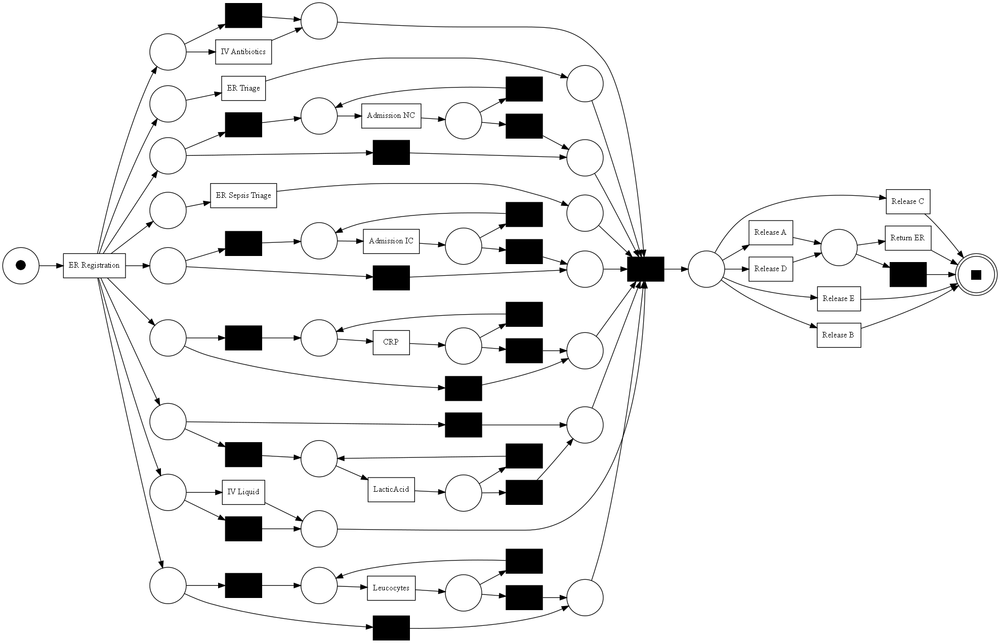

*******************************************************************************************************
conformance checking for the inductive algorithm for 300 random traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 415/415 [03:56<00:00,  1.76it/s]
computing precision with alignments, completed variants :: 100%|██████████| 3253/3253 [1:19:43<00:00,  1.47s/it]
replaying log with TBR, completed traces :: 100%|██████████| 415/415 [00:01<00:00, 360.89it/s]


           Metric     Value
0         Fitness  0.999303
1       Precision  0.314075
2  Generalization  0.840335
3      Simplicity  0.600000


In [326]:
# Get all case IDs from the filtered_log
filtered_log_case_ids = list(set(pm4py.get_trace_attribute_values(filtered_log, "case:concept:name").keys()))

values_of_i = [1, 2, 3, 4, 5, 8, 9, 10, 50, 100, 150, 250, 300]

for i in values_of_i:
    # If there are fewer than i unique cases, adjust the sample size
    sample_size = min(i, len(filtered_log_case_ids))
    # Randomly select i case IDs (or all if fewer than i)
    selected_cases = random.sample(filtered_log_case_ids, sample_size)
    # Filter the log to keep only the selected cases for the random_log
    random_log = pm4py.filter_trace_attribute_values(filtered_log, "case:concept:name", selected_cases)
    # Filter the log to keep the cases NOT in the random_log
    remaining_cases = list(set(filtered_log_case_ids) - set(selected_cases))
    remaining_log = pm4py.filter_trace_attribute_values(filtered_log, "case:concept:name", remaining_cases)
    print('*******************************************************************************************************')
    print(f"Now selecting {i} random traces")
    print('*******************************************************************************************************')
    print(f"Number of traces in random_log: {len(selected_cases)}")
    print(f"Number of traces in remaining_log: {len(remaining_cases)}")
    print(f"Total number of traces (random + remaining): {len(filtered_log_case_ids)}")
    # calculate the train-test ratio
    train_size = len(selected_cases)
    test_size = len(remaining_cases)
    train_ratio = (train_size / len(filtered_log_case_ids)) * 100 if test_size > 0 else float('inf')
    test_ratio = (test_size / len(filtered_log_case_ids)) * 100 if test_size > 0 else float('inf')
    print(f"train-test ratio: train: {train_ratio:.2f}% , test: {test_ratio:.2f}%")
    # discover a petri net for i random traces
    pn_cur, im_cur, fm_cur = pm4py.discover_petri_net_inductive(random_log)
    net= pm4py.discover_petri_net_inductive(random_log)
    print('*******************************************************************************************************')
    print(f"Inductive Petri Net for {i} random traces")
    print('*******************************************************************************************************')
    pm4py.view_petri_net(pn_cur, im_cur, fm_cur)
    print('*******************************************************************************************************')
    print(f"conformance checking for the inductive algorithm for {i} random traces")
    print('*******************************************************************************************************')
    aligments(remaining_log,net)
    net_heuristics = pm4py.discover_petri_net_heuristics(random_log)
    pn_cur_heuristics, im_cur_heuristics, fm_cur_heuristics = pm4py.discover_petri_net_heuristics(random_log)
    print('*******************************************************************************************************')
    print(f"Heuristics Petri Net for {i} random traces")
    print('*******************************************************************************************************')
    pm4py.view_petri_net(pn_cur_heuristics, im_cur_heuristics, fm_cur_heuristics)
    print('*******************************************************************************************************')
    print(f"conformance checking for the heuristics algorithm for {i} random traces")
    print('*******************************************************************************************************')
    print("********************************************************************************")
    print("Soundeness check: ")
    print("********************************************************************************")
    is_sound = woflan.apply(*net_heuristics, parameters=woflan_parameters)
    print(f"Is sound: {is_sound}")
    if (not is_sound):
            print('This net is not sound, hence we can not perform conformance checking!')
    else:
            aligments(remaining_log,net_heuristics)

### buliding the model with different number of the most common traces each time
Here we applied the inductive algorithm and the heuristics algorithm (wherever we got a sound model), which according to the lectures is the best algorithm for finding a model. Here, too, we chose each time a certain number of the most common traces from which we discovered the model.

*******************************************************************************************************
Now selecting 1 most common traces
*******************************************************************************************************
Number of traces in current log: 5
Number of traces in remaining_log: 729
Total number of traces (current + remaining): 734
train-test ratio: train: 0.68% , test: 99.32%
*******************************************************************************************************
Inductive Petri Net for 1 most common traces
*******************************************************************************************************


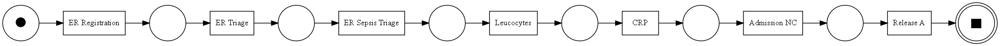

*******************************************************************************************************
conformance checking for the inductive algorithm for 1 most common traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 684/684 [00:05<00:00, 129.35it/s]
computing precision with alignments, completed variants :: 100%|██████████| 5115/5115 [00:11<00:00, 445.09it/s]
replaying log with TBR, completed traces :: 100%|██████████| 684/684 [00:00<00:00, 815.90it/s] 


           Metric     Value
0         Fitness  0.583736
1       Precision  1.000000
2  Generalization  0.968690
3      Simplicity  1.000000
*******************************************************************************************************
Now selecting 3 most common traces
*******************************************************************************************************
Number of traces in current log: 13
Number of traces in remaining_log: 721
Total number of traces (current + remaining): 734
train-test ratio: train: 1.77% , test: 98.23%
*******************************************************************************************************
Inductive Petri Net for 3 most common traces
*******************************************************************************************************


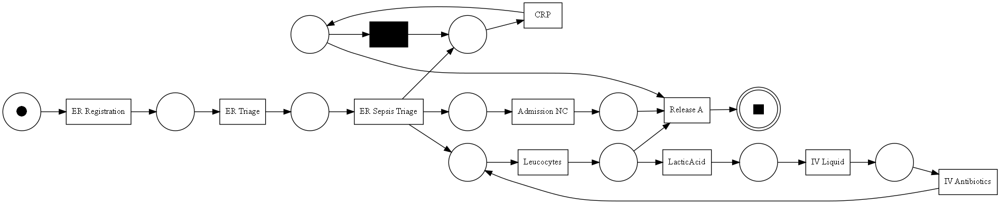

*******************************************************************************************************
conformance checking for the inductive algorithm for 3 most common traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 682/682 [00:08<00:00, 77.22it/s] 
computing precision with alignments, completed variants :: 100%|██████████| 5115/5115 [00:14<00:00, 358.09it/s]
replaying log with TBR, completed traces :: 100%|██████████| 682/682 [00:00<00:00, 777.67it/s]


           Metric     Value
0         Fitness  0.762191
1       Precision  0.934338
2  Generalization  0.967869
3      Simplicity  0.793103
*******************************************************************************************************
Now selecting 5 most common traces
*******************************************************************************************************
Number of traces in current log: 21
Number of traces in remaining_log: 713
Total number of traces (current + remaining): 734
train-test ratio: train: 2.86% , test: 97.14%
*******************************************************************************************************
Inductive Petri Net for 5 most common traces
*******************************************************************************************************


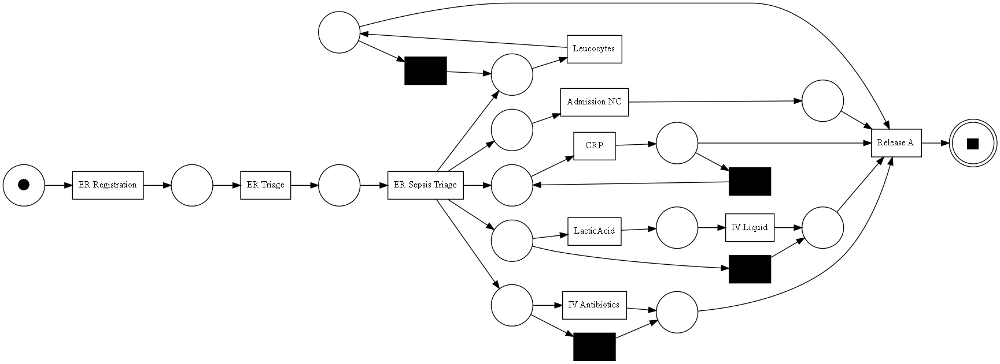

*******************************************************************************************************
conformance checking for the inductive algorithm for 5 most common traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 680/680 [00:10<00:00, 66.03it/s]
computing precision with alignments, completed variants :: 100%|██████████| 5115/5115 [00:22<00:00, 232.01it/s]
replaying log with TBR, completed traces :: 100%|██████████| 680/680 [00:01<00:00, 647.69it/s]


           Metric     Value
0         Fitness  0.878759
1       Precision  0.789002
2  Generalization  0.953568
3      Simplicity  0.674419
*******************************************************************************************************
Now selecting 8 most common traces
*******************************************************************************************************
Number of traces in current log: 30
Number of traces in remaining_log: 704
Total number of traces (current + remaining): 734
train-test ratio: train: 4.09% , test: 95.91%
*******************************************************************************************************
Inductive Petri Net for 8 most common traces
*******************************************************************************************************


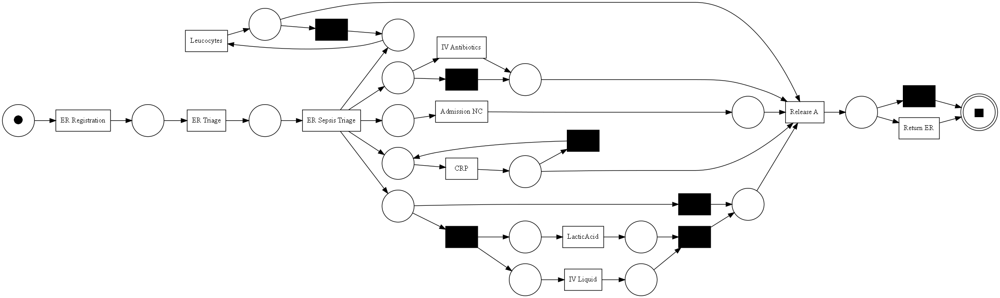

*******************************************************************************************************
conformance checking for the inductive algorithm for 8 most common traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 677/677 [00:08<00:00, 77.97it/s] 
computing precision with alignments, completed variants :: 100%|██████████| 5112/5112 [00:32<00:00, 157.22it/s]
replaying log with TBR, completed traces :: 100%|██████████| 677/677 [00:01<00:00, 506.29it/s]


           Metric     Value
0         Fitness  0.914004
1       Precision  0.757612
2  Generalization  0.953523
3      Simplicity  0.672727
*******************************************************************************************************
Now selecting 9 most common traces
*******************************************************************************************************
Number of traces in current log: 33
Number of traces in remaining_log: 701
Total number of traces (current + remaining): 734
train-test ratio: train: 4.50% , test: 95.50%
*******************************************************************************************************
Inductive Petri Net for 9 most common traces
*******************************************************************************************************


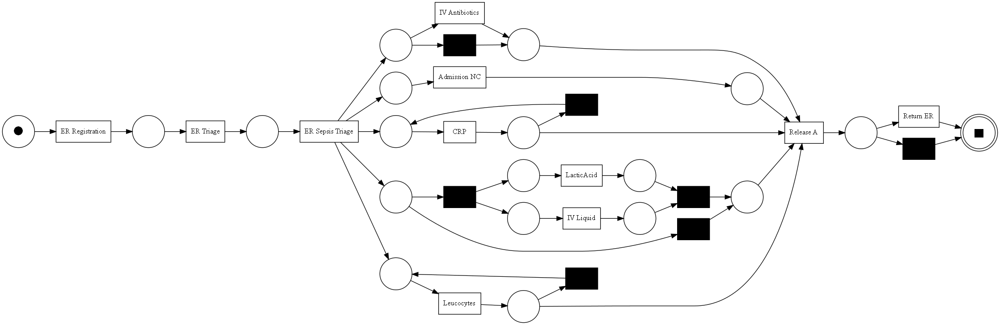

*******************************************************************************************************
conformance checking for the inductive algorithm for 9 most common traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 676/676 [00:08<00:00, 83.14it/s] 
computing precision with alignments, completed variants :: 100%|██████████| 5112/5112 [00:33<00:00, 152.21it/s]
replaying log with TBR, completed traces :: 100%|██████████| 676/676 [00:01<00:00, 501.55it/s]


           Metric     Value
0         Fitness  0.913636
1       Precision  0.757849
2  Generalization  0.953460
3      Simplicity  0.672727
*******************************************************************************************************
Now selecting 10 most common traces
*******************************************************************************************************
Number of traces in current log: 35
Number of traces in remaining_log: 699
Total number of traces (current + remaining): 734
train-test ratio: train: 4.77% , test: 95.23%
*******************************************************************************************************
Inductive Petri Net for 10 most common traces
*******************************************************************************************************


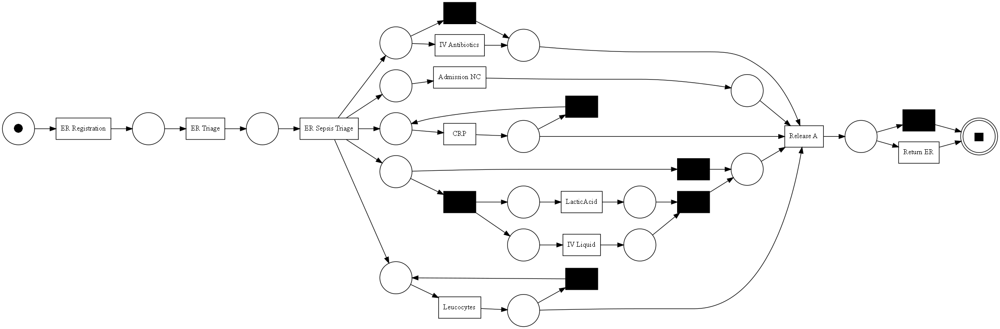

*******************************************************************************************************
conformance checking for the inductive algorithm for 10 most common traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 675/675 [00:08<00:00, 78.83it/s] 
computing precision with alignments, completed variants :: 100%|██████████| 5112/5112 [00:35<00:00, 145.98it/s]
replaying log with TBR, completed traces :: 100%|██████████| 675/675 [00:02<00:00, 261.28it/s]


           Metric     Value
0         Fitness  0.913389
1       Precision  0.757809
2  Generalization  0.953418
3      Simplicity  0.672727
*******************************************************************************************************
Now selecting 50 most common traces
*******************************************************************************************************
Number of traces in current log: 99
Number of traces in remaining_log: 635
Total number of traces (current + remaining): 734
train-test ratio: train: 13.49% , test: 86.51%
*******************************************************************************************************
Inductive Petri Net for 50 most common traces
*******************************************************************************************************


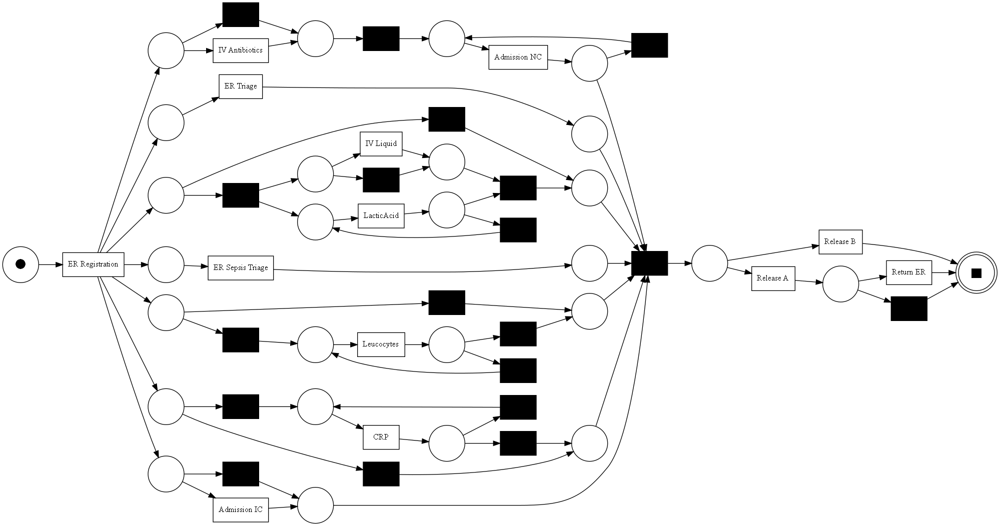

*******************************************************************************************************
conformance checking for the inductive algorithm for 50 most common traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 635/635 [01:04<00:00,  9.79it/s]
computing precision with alignments, completed variants :: 100%|██████████| 4948/4948 [20:41<00:00,  3.98it/s]  
replaying log with TBR, completed traces :: 100%|██████████| 635/635 [00:01<00:00, 366.31it/s]


           Metric     Value
0         Fitness  0.990267
1       Precision  0.490529
2  Generalization  0.895861
3      Simplicity  0.625000
*******************************************************************************************************
Now selecting 100 most common traces
*******************************************************************************************************
Number of traces in current log: 149
Number of traces in remaining_log: 585
Total number of traces (current + remaining): 734
train-test ratio: train: 20.30% , test: 79.70%
*******************************************************************************************************
Inductive Petri Net for 100 most common traces
*******************************************************************************************************


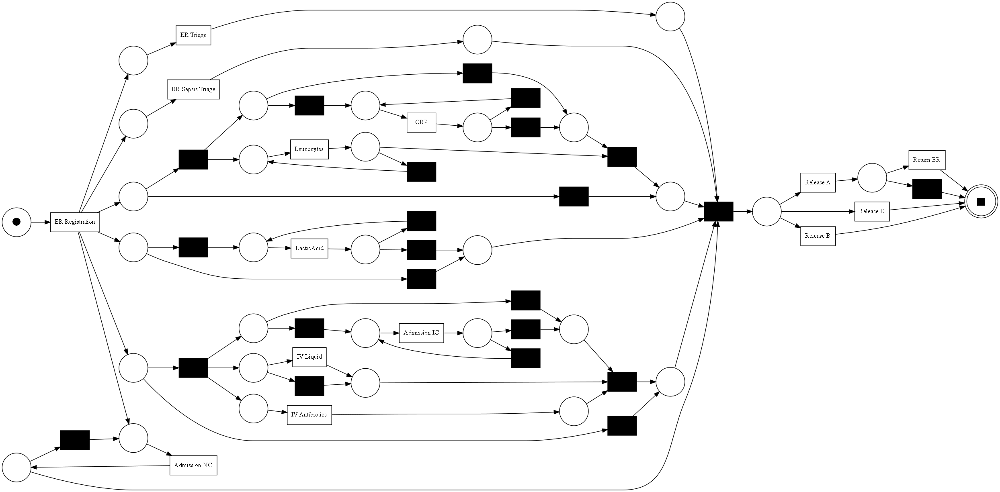

*******************************************************************************************************
conformance checking for the inductive algorithm for 100 most common traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 585/585 [01:16<00:00,  7.62it/s]
computing precision with alignments, completed variants :: 100%|██████████| 4536/4536 [29:08<00:00,  2.59it/s]  
replaying log with TBR, completed traces :: 100%|██████████| 585/585 [00:01<00:00, 311.31it/s]


           Metric     Value
0         Fitness  0.993944
1       Precision  0.459232
2  Generalization  0.881779
3      Simplicity  0.621622
*******************************************************************************************************
Now selecting 150 most common traces
*******************************************************************************************************
Number of traces in current log: 199
Number of traces in remaining_log: 535
Total number of traces (current + remaining): 734
train-test ratio: train: 27.11% , test: 72.89%
*******************************************************************************************************
Inductive Petri Net for 150 most common traces
*******************************************************************************************************


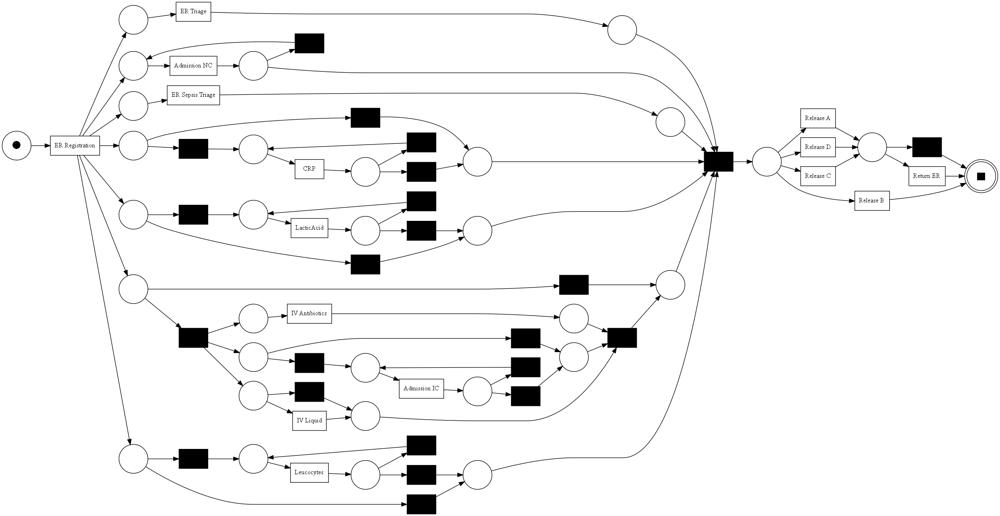

*******************************************************************************************************
conformance checking for the inductive algorithm for 150 most common traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 535/535 [01:27<00:00,  6.12it/s]
computing precision with alignments, completed variants :: 100%|██████████| 4252/4252 [48:06<00:00,  1.47it/s]  
replaying log with TBR, completed traces :: 100%|██████████| 535/535 [00:01<00:00, 360.69it/s]


           Metric     Value
0         Fitness  0.997726
1       Precision  0.436405
2  Generalization  0.877113
3      Simplicity  0.614035
*******************************************************************************************************
Now selecting 300 most common traces
*******************************************************************************************************
Number of traces in current log: 349
Number of traces in remaining_log: 385
Total number of traces (current + remaining): 734
train-test ratio: train: 47.55% , test: 52.45%
*******************************************************************************************************
Inductive Petri Net for 300 most common traces
*******************************************************************************************************


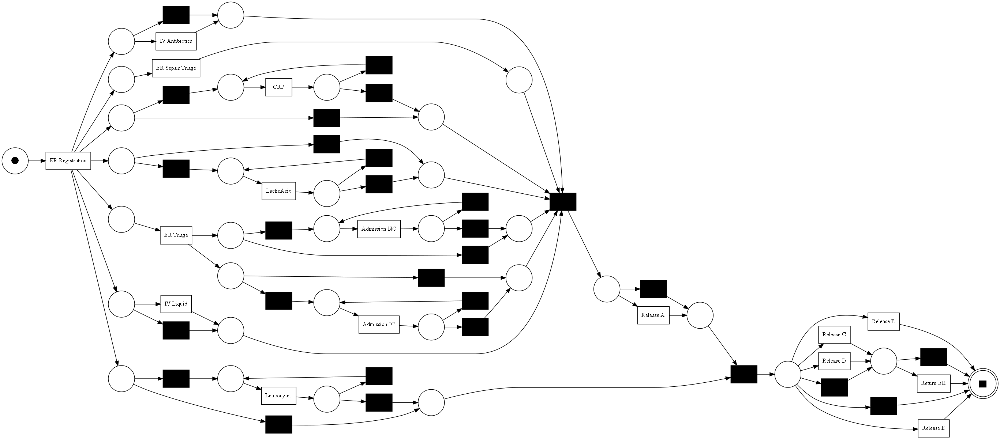

*******************************************************************************************************
conformance checking for the inductive algorithm for 300 most common traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 385/385 [03:22<00:00,  1.90it/s]
computing precision with alignments, completed variants :: 100%|██████████| 3107/3107 [1:13:42<00:00,  1.42s/it]
replaying log with TBR, completed traces :: 100%|██████████| 385/385 [00:01<00:00, 329.78it/s]

           Metric     Value
0         Fitness  0.999804
1       Precision  0.297168
2  Generalization  0.846372
3      Simplicity  0.606299


In [328]:
# Get all case IDs from the filtered_log
filtered_log_case_ids = list(set(pm4py.get_trace_attribute_values(filtered_log, "case:concept:name").keys()))

values_of_i = [1, 3, 5, 8, 9, 10, 50, 100, 150, 300]
current_log = pm4py.filter_variants_top_k(filtered_log, i)


for i in values_of_i:
    # Filter the log to keep only the selected cases for the current_log
    current_log = pm4py.filter_variants_top_k(filtered_log, i)
    selected_cases = pm4py.get_trace_attribute_values(current_log, "case:concept:name").keys()
    # Filter the log to keep the cases NOT in the current_log
    remaining_cases = list(set(filtered_log_case_ids) - set(selected_cases))
    remaining_log = pm4py.filter_trace_attribute_values(filtered_log, "case:concept:name", remaining_cases)
    print('*******************************************************************************************************')
    print(f"Now selecting {i} most common traces")
    print('*******************************************************************************************************')
    print(f"Number of traces in current log: {len(selected_cases)}")
    print(f"Number of traces in remaining_log: {len(remaining_cases)}")
    print(f"Total number of traces (current + remaining): {len(filtered_log_case_ids)}")
    # calculate the train-test ratio
    train_size = len(selected_cases)
    test_size = len(remaining_cases)
    train_ratio = (train_size / len(filtered_log_case_ids)) * 100 if test_size > 0 else float('inf')
    test_ratio = (test_size / len(filtered_log_case_ids)) * 100 if test_size > 0 else float('inf')
    print(f"train-test ratio: train: {train_ratio:.2f}% , test: {test_ratio:.2f}%")
    # discover a petri net for i random traces
    pn_cur, im_cur, fm_cur = pm4py.discover_petri_net_inductive(current_log)
    net= pm4py.discover_petri_net_inductive(current_log)
    print('*******************************************************************************************************')
    print(f"Inductive Petri Net for {i} most common traces")
    print('*******************************************************************************************************')
    pm4py.view_petri_net(pn_cur, im_cur, fm_cur)
    print('*******************************************************************************************************')
    print(f"conformance checking for the inductive algorithm for {i} most common traces")
    print('*******************************************************************************************************')
    aligments(remaining_log,net)
    net_heuristics = pm4py.discover_petri_net_heuristics(random_log)
    pn_cur_heuristics, im_cur_heuristics, fm_cur_heuristics = pm4py.discover_petri_net_heuristics(random_log)
    print('*******************************************************************************************************')
    print(f"Heuristics Petri Net for {i} random traces")
    print('*******************************************************************************************************')
    pm4py.view_petri_net(pn_cur_heuristics, im_cur_heuristics, fm_cur_heuristics)
    print('*******************************************************************************************************')
    print(f"conformance checking for the heuristics algorithm for {i} random traces")
    print('*******************************************************************************************************')
    print("********************************************************************************")
    print("Soundeness check: ")
    print("********************************************************************************")
    is_sound = woflan.apply(*net_heuristics, parameters=woflan_parameters)
    print(f"Is sound: {is_sound}")
    if (not is_sound):
        print('This net is not sound, hence we can not perform conformance checking!')
    else:
        aligments(remaining_log,net_heuristics)

## The selected model
In the end, we chose the model that was discovered from the three most common traces (and the report explains in detail why we chose it). In this part, we showed the data obtained on it from the conformance checking, what traces are present in it, what is its train-test ratio, and we also checked the Being the sound model.

*******************************************************************************************************
Now selecting 3 most common traces
*******************************************************************************************************


,variant,count,percentile
122,"(ER Registration, ER Triage, ER Sepsis Triage, Leucocytes, CRP, Admission NC, Release A)",5,0.681199
183,"(ER Registration, ER Triage, ER Sepsis Triage, LacticAcid, Leucocytes, CRP, IV Liquid, IV Antibiotics, Admission NC, Release A)",4,0.544959
48,"(ER Registration, ER Triage, ER Sepsis Triage, CRP, Leucocytes, Admission NC, Release A)",4,0.544959


Number of traces in current log: 13
Number of traces in remaining_log: 721
Total number of traces (current + remaining): 734
train-test ratio: train: 1.77% , test: 98.23%
*******************************************************************************************************
Inductive Petri Net for 3 most common traces
*******************************************************************************************************


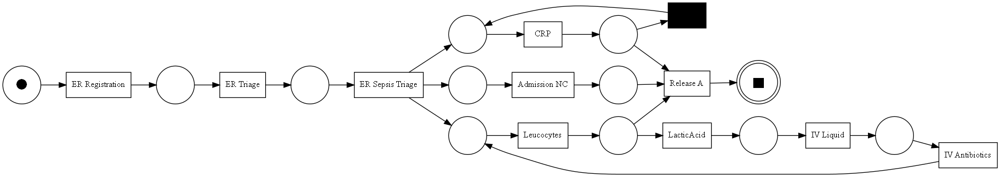

********************************************************************************
Soundeness check: 
********************************************************************************
Input is ok.
Petri Net is a workflow net.
Every place is covered by s-components.
There are no dead tasks.
All tasks are live.
Is the model sound: True
*******************************************************************************************************
Reachability graph Net for 3 most common traces
*******************************************************************************************************


c:\Users\Lenovo\anaconda3\envs\dm\lib\site-packages\pm4py\algo\analysis\woflan\place_invariants\utility.py:153: UserWarning: solution from scipy may be unstable. Please install PuLP (pip install pulp) for fully reliable results.
  warnings.warn("solution from scipy may be unstable. Please install PuLP (pip install pulp) for fully reliable results.")


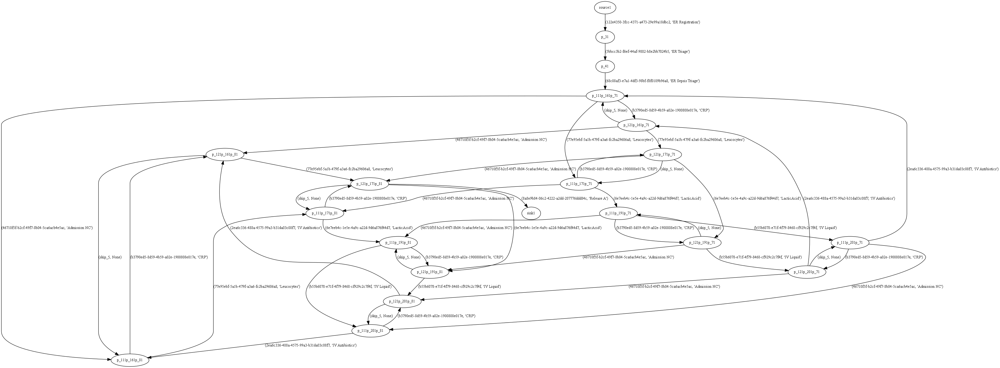

*******************************************************************************************************
conformance checking for the inductive algorithm for 3 most common traces
*******************************************************************************************************


aligning log, completed variants :: 100%|██████████| 682/682 [00:10<00:00, 63.46it/s]
computing precision with alignments, completed variants :: 100%|██████████| 5115/5115 [00:14<00:00, 362.43it/s]
replaying log with TBR, completed traces :: 100%|██████████| 682/682 [00:00<00:00, 776.49it/s]

           Metric     Value
0         Fitness  0.762191
1       Precision  0.934338
2  Generalization  0.967869
3      Simplicity  0.793103


In [17]:
woflan_parameters = {
    woflan.Parameters.RETURN_ASAP_WHEN_NOT_SOUND: False,
    woflan.Parameters.PRINT_DIAGNOSTICS: True,
    woflan.Parameters.RETURN_DIAGNOSTICS: False
}
# Get all case IDs from the filtered_log
filtered_log_case_ids = list(set(pm4py.get_trace_attribute_values(filtered_log, "case:concept:name").keys()))

values_of_i = [3]
for i in values_of_i:
    print('*******************************************************************************************************')
    print(f"Now selecting {i} most common traces")
    print('*******************************************************************************************************')
    display(common_variants[0:i])
    # Filter the log to keep only the selected cases for the current_log
    current_log = pm4py.filter_variants_top_k(filtered_log, i)
    selected_cases = pm4py.get_trace_attribute_values(current_log, "case:concept:name").keys()
    # Filter the log to keep the cases NOT in the current_log
    remaining_cases = list(set(filtered_log_case_ids) - set(selected_cases))
    remaining_log = pm4py.filter_trace_attribute_values(filtered_log, "case:concept:name", remaining_cases)
    print(f"Number of traces in current log: {len(selected_cases)}")
    print(f"Number of traces in remaining_log: {len(remaining_cases)}")
    print(f"Total number of traces (current + remaining): {len(filtered_log_case_ids)}")
    # calculate the train-test ratio
    train_size = len(selected_cases)
    test_size = len(remaining_cases)
    train_ratio = (train_size / len(filtered_log_case_ids)) * 100 if test_size > 0 else float('inf')
    test_ratio = (test_size / len(filtered_log_case_ids)) * 100 if test_size > 0 else float('inf')
    print(f"train-test ratio: train: {train_ratio:.2f}% , test: {test_ratio:.2f}%")
    # discover a petri net for i random traces
    pn_cur, im_cur, fm_cur = pm4py.discover_petri_net_inductive(current_log)
    net= pm4py.discover_petri_net_inductive(current_log)
    print('*******************************************************************************************************')
    print(f"Inductive Petri Net for {i} most common traces")
    print('*******************************************************************************************************')
    pm4py.view_petri_net(pn_cur, im_cur, fm_cur)
    print("********************************************************************************")
    print("Soundeness check: ")
    print("********************************************************************************")
    is_sound = woflan.apply(*net, parameters=woflan_parameters)
    if (not is_sound):
        print("The model not sound!")
    print(f"Is the model sound: {is_sound}")
    print('*******************************************************************************************************')
    print(f"Reachability graph Net for {i} most common traces")
    print('*******************************************************************************************************')
    ts = reachability_graph.construct_reachability_graph(pn_cur, im_cur)
    gviz = ts_visualizer.apply(ts, parameters={ts_visualizer.Variants.VIEW_BASED.value.Parameters.FORMAT: "png"})
    ts_visualizer.view(gviz)
    print('*******************************************************************************************************')
    print(f"conformance checking for the inductive algorithm for {i} most common traces")
    print('*******************************************************************************************************')
    aligments(remaining_log,net)


In [18]:
fitness = pm4py.fitness_alignments(remaining_log, *net)
precision = pm4py.precision_alignments(remaining_log, *net)
generalization = generalization_evaluator.apply(remaining_log, *net)
simplicity = simplicity_evaluator.apply(net[0])

pd.DataFrame({"Fitness": [fitness["averageFitness"]],
              "Precision": [precision],
              "Generalization": [generalization],
              "Simplicity": [simplicity]})

aligning log, completed variants :: 100%|██████████| 682/682 [00:09<00:00, 72.61it/s]
computing precision with alignments, completed variants :: 100%|██████████| 5115/5115 [00:15<00:00, 328.26it/s]
replaying log with TBR, completed traces :: 100%|██████████| 682/682 [00:00<00:00, 692.17it/s]


,Fitness,Precision,Generalization,Simplicity
0,0.762191,0.934338,0.967869,0.793103


## Additional perspectives of the data

#### Mining Resources and activities dependencies  in the databsae

In [ ]:
roles = pm4py.discover_organizational_roles(log, resource_key='org:group', activity_key='concept:name', timestamp_key='time:timestamp', case_id_key='case:concept:name')
print("activities per each group:")
roles


activities per each group:


[Activities: ['Release A', 'Release B', 'Release C', 'Release D', 'Release E'] Originators importance {'E': 782},
 Activities: ['ER Registration', 'ER Sepsis Triage', 'IV Antibiotics', 'IV Liquid'] Originators importance {'A': 3462, 'L': 213},
 Activities: ['CRP', 'LacticAcid', 'Leucocytes'] Originators importance {'B': 8111},
 Activities: ['Admission NC'] Originators importance {'D': 47, 'F': 216, 'G': 148, 'H': 55, 'I': 126, 'J': 17, 'K': 17, 'M': 84, 'N': 46, 'O': 186, 'P': 5, 'Q': 63, 'R': 57, 'S': 33, 'T': 35, 'U': 18, 'V': 25, 'W': 2, 'X': 1, 'Y': 1},
 Activities: ['Admission IC'] Originators importance {'J': 9, 'K': 1, 'P': 54, 'W': 53},
 Activities: ['Return ER'] Originators importance {'?': 294},
 Activities: ['ER Triage'] Originators importance {'C': 1053}]

In [ ]:
net_ana = pm4py.discover_network_analysis(log, out_column='case:concept:name', in_column='case:concept:name', node_column_source='org:group', node_column_target='org:group', edge_column='concept:name')
net_ana

{('?', 'B'): {'Return ER': 3},
 ('A', 'A'): {'ER Registration': 31,
  'ER Sepsis Triage': 338,
  'IV Antibiotics': 61,
  'IV Liquid': 500},
 ('A', 'B'): {'ER Registration': 37,
  'ER Sepsis Triage': 583,
  'IV Antibiotics': 118,
  'IV Liquid': 130},
 ('A', 'C'): {'ER Registration': 916,
  'ER Sepsis Triage': 4,
  'IV Antibiotics': 5,
  'IV Liquid': 21},
 ('A', 'D'): {'ER Sepsis Triage': 2, 'IV Antibiotics': 21},
 ('A', 'E'): {'IV Antibiotics': 3, 'IV Liquid': 3},
 ('A', 'F'): {'ER Sepsis Triage': 1, 'IV Antibiotics': 76, 'IV Liquid': 8},
 ('A', 'G'): {'ER Sepsis Triage': 4, 'IV Antibiotics': 100, 'IV Liquid': 13},
 ('A', 'H'): {'IV Antibiotics': 13, 'IV Liquid': 5},
 ('A', 'I'): {'ER Sepsis Triage': 1, 'IV Antibiotics': 49, 'IV Liquid': 5},
 ('A', 'J'): {'IV Antibiotics': 3},
 ('A', 'K'): {'IV Antibiotics': 10},
 ('A', 'M'): {'IV Antibiotics': 22, 'IV Liquid': 1},
 ('A', 'N'): {'ER Sepsis Triage': 2, 'IV Antibiotics': 12},
 ('A', 'O'): {'ER Sepsis Triage': 2, 'IV Antibiotics': 74, 'IV 

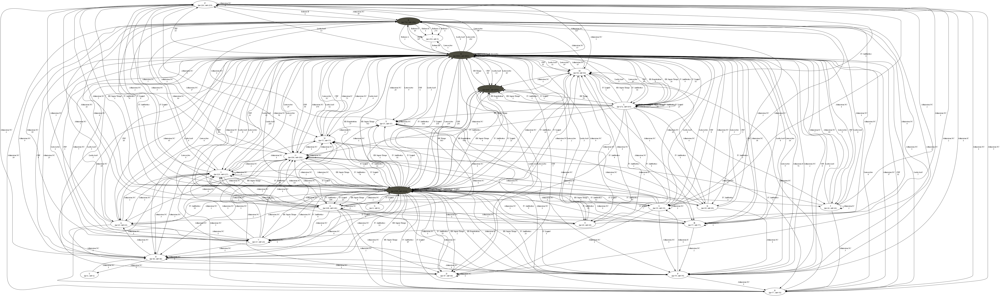

In [ ]:
net_ana = pm4py.discover_network_analysis(log, out_column='case:concept:name', in_column='case:concept:name', node_column_source='org:group', node_column_target='org:group', edge_column='concept:name')
pm4py.view_network_analysis(net_ana)

## Complete mapping between activities and resources

In [ ]:
activity_attribute = "concept:name"
activities = log.groupby(activity_attribute)[activity_attribute].count()
resource_attribute = "org:group"
activities_resources = log.groupby(activity_attribute)[resource_attribute].unique().agg(", ".join)
display(pd.merge(activities, activities_resources, left_index=True, right_index=True)["org:group"])


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_9816\231359504.py:4: FutureWarning: using <built-in method join of str object at 0x000001A5E3193F30> in Series.agg cannot aggregate and has been deprecated. Use Series.transform to keep behavior unchanged.
  activities_resources = log.groupby(activity_attribute)[resource_attribute].unique().agg(", ".join)


concept:name
Admission IC                                                        J, P, K, W
Admission NC        D, F, G, H, I, J, K, M, N, O, Q, R, S, T, U, V, P, X, W, Y
CRP                                                                          B
ER Registration                                                           A, L
ER Sepsis Triage                                                          A, L
ER Triage                                                                    C
IV Antibiotics                                                            A, L
IV Liquid                                                                 A, L
LacticAcid                                                                   B
Leucocytes                                                                   B
Release A                                                                    E
Release B                                                                    E
Release C                              

#### Timing Analysis in the databsae

In [332]:
case_durations = pm4py.get_all_case_durations(log, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
case_arr_avg = pm4py.get_case_arrival_average(dataframe, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
case_arr_avg_in_hours = case_arr_avg / (60*60)
case_arr_avg_in_days = case_arr_avg / (60*60*24)
print("The average case duration (in seconds) is: {:.2f}".format(case_arr_avg))
print("The average case duration (in hours) is: {:.2f}".format(case_arr_avg_in_hours))
print("The average case duration (in days) is: {:.2f}".format(case_arr_avg_in_days))

The average case duration (in seconds) is: 2514265.17
The average case duration (in hours) is: 698.41
The average case duration (in days) is: 29.10


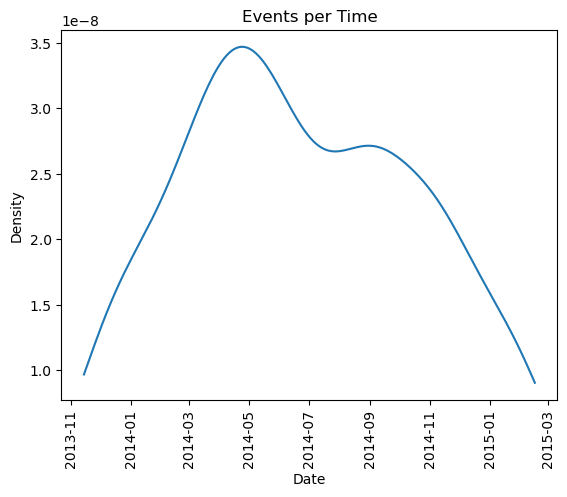

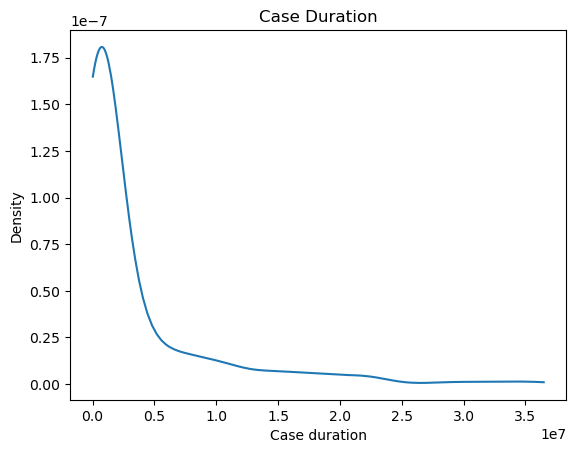

In [ ]:
pm4py.view_events_per_time_graph(filtered_log)
pm4py.view_case_duration_graph(filtered_log)

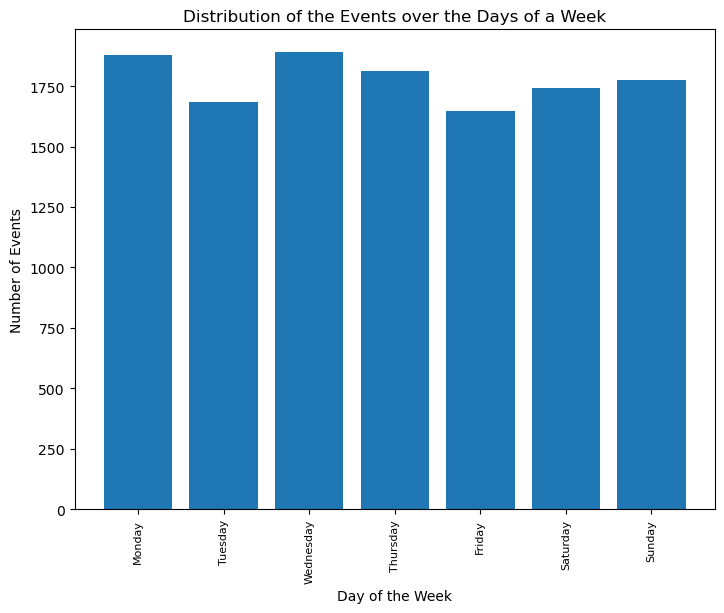

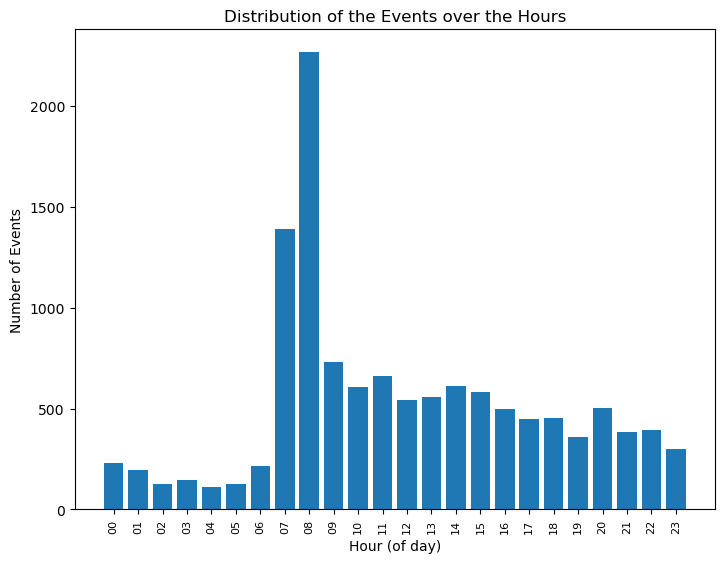

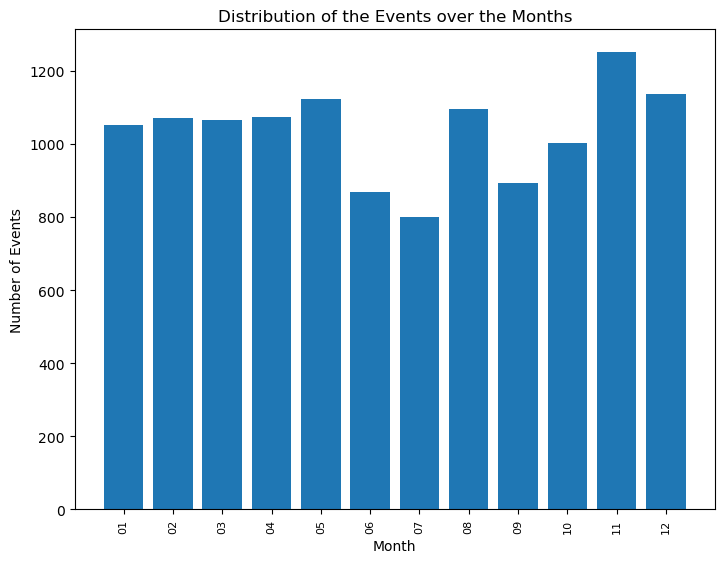

In [ ]:
pm4py.view_events_distribution_graph(filtered_log)
pm4py.view_events_distribution_graph(filtered_log, distr_type="hours")
pm4py.view_events_distribution_graph(filtered_log, distr_type="months")

### Analysis of times and durations of activities in the selected model

replaying log with TBR, completed traces :: 100%|██████████| 685/685 [00:01<00:00, 377.62it/s]


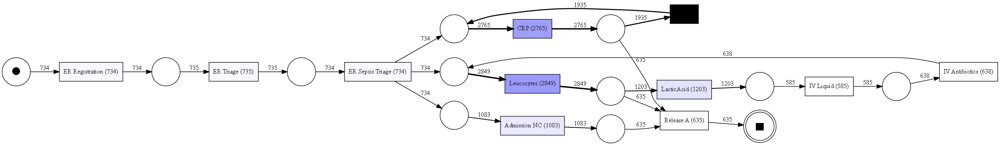

replaying log with TBR, completed traces :: 100%|██████████| 685/685 [00:01<00:00, 620.11it/s]


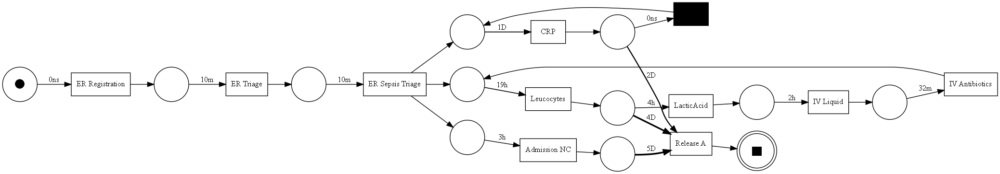

In [ ]:
# add frequencies
parameters_freq = {pn_visualizer.Variants.FREQUENCY.value.Parameters.FORMAT: "png"}
gviz_freq = pn_visualizer.apply(*net, parameters=parameters_freq, variant=pn_visualizer.Variants.FREQUENCY, log=filtered_log)
pn_visualizer.view(gviz_freq)


# add temporal information
parameters_temp = {pn_visualizer.Variants.PERFORMANCE.value.Parameters.FORMAT: "png"}
gviz_temp = pn_visualizer.apply(*net, parameters=parameters_temp, variant=pn_visualizer.Variants.PERFORMANCE, log=filtered_log)
pn_visualizer.view(gviz_temp)


## Mining Decision points in our model

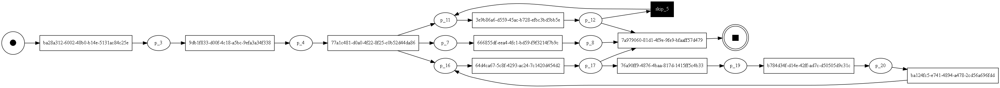

{'p_17': ['76a90ff9-4876-4baa-817d-1415ff5c4b33', '7a979060-81d1-4f9e-9fe9-bfaaff57d479'], 'p_12': ['7a979060-81d1-4f9e-9fe9-bfaaff57d479', 'skip_5']}


replaying log with TBR, completed traces :: 100%|██████████| 685/685 [00:01<00:00, 594.07it/s]
c:\Users\Lenovo\anaconda3\envs\dm\lib\site-packages\pm4py\algo\decision_mining\algorithm.py:533: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_mod["Target"] = df_mod[target_column].replace(map_to_int)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_9816\2175754480.py:12: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X = X.fillna(0)


Decision point: p_12; possible decisions: ['skip_5', 'Release A', 'None']


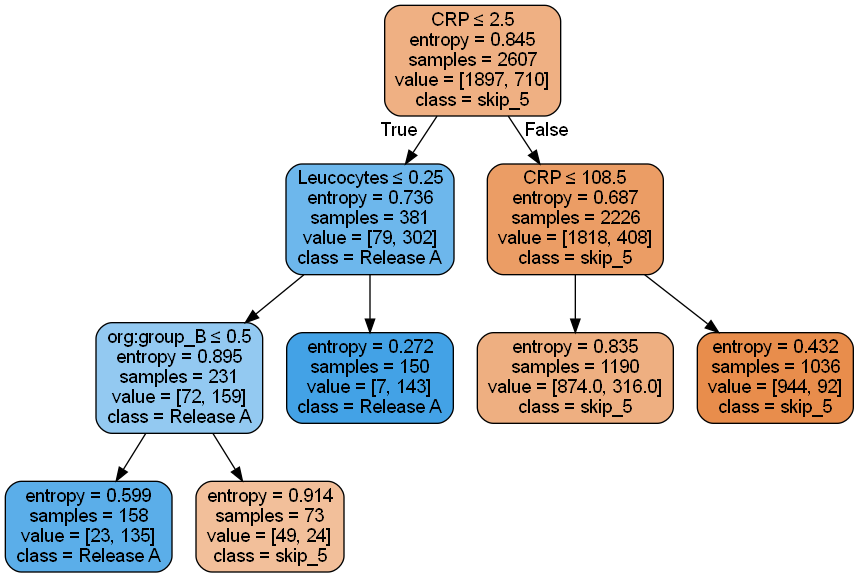

replaying log with TBR, completed traces :: 100%|██████████| 685/685 [00:01<00:00, 558.98it/s]


Decision point: p_17; possible decisions: ['LacticAcid', 'Release A']


c:\Users\Lenovo\anaconda3\envs\dm\lib\site-packages\pm4py\algo\decision_mining\algorithm.py:533: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_mod["Target"] = df_mod[target_column].replace(map_to_int)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_9816\2175754480.py:12: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X = X.fillna(0)


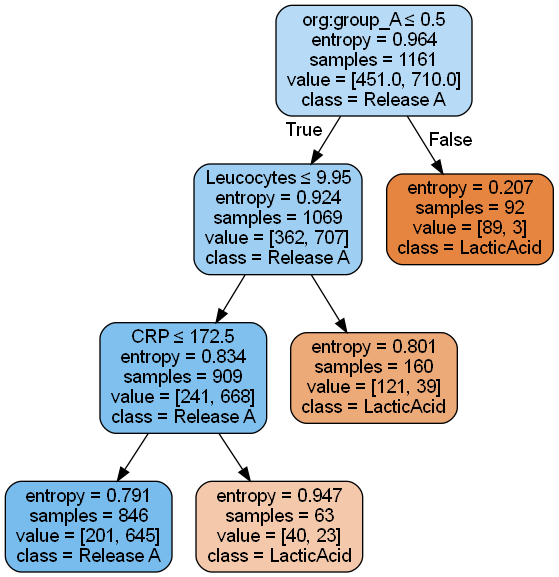

In [ ]:
# View the identifiers of the nodes in the WF-net
gviz = visualizer.apply(*net, parameters={visualizer.Variants.WO_DECORATION.value.Parameters.DEBUG: True})
visualizer.view(gviz)

attributes = pm4py.get_event_attributes(filtered_log)
attributes = [att for att in attributes if "time" not in att]

decision_points = decision_mining.get_decision_points(net[0])
print(decision_points)
for point in sorted(decision_points.keys()):
  X, y, classes = decision_mining.apply(filtered_log, *net, decision_point=point, attributes=attributes,)
  X = X.fillna(0)
  X = X[~y.isna()]
  y = y[~y.isna()]
  classes = [str(c) for c in classes]

  print(f"Decision point: {point}; possible decisions: {classes}")

  dt = tree.DecisionTreeClassifier(max_depth=3, ccp_alpha=0.01,
                                   random_state=42, criterion="entropy")
  dt = dt.fit(X, y)
  feature_names = list(X.columns.values.tolist())

  gviz = tree_visualizer.apply(dt, feature_names, classes)
  tree_visualizer.view(gviz)

